# 1. Introduction
### I'm using data provided by NathanGeorge on all Lending Club accepted and declined loan requests from the beginning of 2007 to the end of 2018.  We'll observe the commonalities amongst some of the data which includes loan amounts, terms, interest rates, grades, employment length, home ownership, debt-to-income ratio, delinquency rates, FICO scores, credit inquiries, time since last delinquent debt payment, number of open lines of credit, revolving balances, percent available credit utilized, etc.

In [1]:
import pandas as pd
import numpy as np
import re
import matplotlib.pyplot as plt
import seaborn as sns
from datetime import datetime
from dateutil import relativedelta
from IPython.display import display
pd.options.display.max_columns = None
pd.options.display.max_colwidth = None
pd.options.display.max_rows = None

import statsmodels.api as sm 
from statsmodels.graphics.api import abline_plot # For visualling evaluating predictions.
from sklearn.metrics import mean_squared_error, r2_score 
from sklearn.model_selection import train_test_split # For splitting the data.
from sklearn import linear_model, preprocessing 
import warnings # For handling error messages.
warnings.simplefilter(action="ignore", category=FutureWarning)
warnings.filterwarnings(action="ignore", module="scipy", message="^internal gelsd")

# 2. Importing Data
### A preliminary glance of the CSV data showed that there are millions of loans.  The declined loans CSV has only 9 columns of features of which only 3 would reveal any meaningful, though obvious, observations (amount requested, debt-to-income ratio, and employment length).  A cursory glance at the data revealed a date column (issue_d), so I'll limit my results to 2018 and get an idea of what types of data there are.

In [2]:
df = pd.read_csv('accepted_2007_to_2018Q4.csv', parse_dates=['issue_d'], infer_datetime_format=True)
df = df[(df.issue_d >= '2018-01-01 00:00:00') & (df.issue_d < '2019-01-01 00:00:00')]

C:\Users\ffgfggg\anaconda3\lib\site-packages\IPython\core\interactiveshell.py:3063: DtypeWarning: Columns (0,19,49,59,118,129,130,131,134,135,136,139,145,146,147) have mixed types.Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


In [3]:
df.head()

,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,emp_title,emp_length,home_ownership,annual_inc,verification_status,issue_d,loan_status,pymnt_plan,url,desc,purpose,title,zip_code,addr_state,dti,delinq_2yrs,earliest_cr_line,fico_range_low,fico_range_high,inq_last_6mths,mths_since_last_delinq,mths_since_last_record,open_acc,pub_rec,revol_bal,revol_util,total_acc,initial_list_status,out_prncp,out_prncp_inv,total_pymnt,total_pymnt_inv,total_rec_prncp,total_rec_int,total_rec_late_fee,recoveries,collection_recovery_fee,last_pymnt_d,last_pymnt_amnt,next_pymnt_d,last_credit_pull_d,last_fico_range_high,last_fico_range_low,collections_12_mths_ex_med,mths_since_last_major_derog,policy_code,application_type,annual_inc_joint,dti_joint,verification_status_joint,acc_now_delinq,tot_coll_amt,tot_cur_bal,open_acc_6m,open_act_il,open_il_12m,open_il_24m,mths_since_rcnt_il,total_bal_il,il_util,open_rv_12m,open_rv_24m,max_bal_bc,all_util,total_rev_hi_lim,inq_fi,total_cu_tl,inq_last_12m,acc_open_past_24mths,avg_cur_bal,bc_open_to_buy,bc_util,chargeoff_within_12_mths,delinq_amnt,mo_sin_old_il_acct,mo_sin_old_rev_tl_op,mo_sin_rcnt_rev_tl_op,mo_sin_rcnt_tl,mort_acc,mths_since_recent_bc,mths_since_recent_bc_dlq,mths_since_recent_inq,mths_since_recent_revol_delinq,num_accts_ever_120_pd,num_actv_bc_tl,num_actv_rev_tl,num_bc_sats,num_bc_tl,num_il_tl,num_op_rev_tl,num_rev_accts,num_rev_tl_bal_gt_0,num_sats,num_tl_120dpd_2m,num_tl_30dpd,num_tl_90g_dpd_24m,num_tl_op_past_12m,pct_tl_nvr_dlq,percent_bc_gt_75,pub_rec_bankruptcies,tax_liens,tot_hi_cred_lim,total_bal_ex_mort,total_bc_limit,total_il_high_credit_limit,revol_bal_joint,sec_app_fico_range_low,sec_app_fico_range_high,sec_app_earliest_cr_line,sec_app_inq_last_6mths,sec_app_mort_acc,sec_app_open_acc,sec_app_revol_util,sec_app_open_act_il,sec_app_num_rev_accts,sec_app_chargeoff_within_12_mths,sec_app_collections_12_mths_ex_med,sec_app_mths_since_last_major_derog,hardship_flag,hardship_type,hardship_reason,hardship_status,deferral_term,hardship_amount,hardship_start_date,hardship_end_date,payment_plan_start_date,hardship_length,hardship_dpd,hardship_loan_status,orig_projected_additional_accrued_interest,hardship_payoff_balance_amount,hardship_last_payment_amount,disbursement_method,debt_settlement_flag,debt_settlement_flag_date,settlement_status,settlement_date,settlement_amount,settlement_percentage,settlement_term
421097,130954621,NaN,5000.0,5000.0,5000.0,36 months,20.39,186.82,D,D4,General Manager,8 years,RENT,50000.0,Verified,2018-03-01,Current,n,https://lendingclub.com/browse/loanDetail.action?loan_id=130954621,NaN,other,Other,740xx,OK,21.80,1.0,Jan-2009,665.0,669.0,0.0,9.0,NaN,5.0,0.0,116.0,23.2,18.0,w,3780.31,3780.31,2043.690000,2043.69,1219.69,824.00,0.0,0.0,0.0,Mar-2019,186.82,Apr-2019,Mar-2019,609.0,605.0,0.0,9.0,1.0,Individual,NaN,NaN,NaN,0.0,0.0,19344.0,0.0,2.0,0.0,1.0,16.0,14118.0,51.0,1.0,2.0,85.0,58.0,500.0,9.0,0.0,5.0,3.0,3869.0,384.0,23.2,1.0,0.0,80.0,13.0,11.0,11.0,0.0,11.0,NaN,2.0,NaN,4.0,2.0,2.0,2.0,2.0,15.0,2.0,2.0,2.0,5.0,0.0,0.0,1.0,1.0,77.8,0.0,0.0,0.0,33430.0,19344.0,500.0,27820.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,N,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Cash,N,NaN,NaN,NaN,NaN,NaN,NaN
421098,130964697,NaN,15000.0,15000.0,15000.0,36 months,9.92,483.45,B,B2,IT Director,2 years,OWN,196000.0,Source Verified,2018-03-01,Current,n,https://lendingclub.com/browse/loanDetail.action?loan_id=130964697,NaN,debt_consolidation,Debt consolidation,337xx,FL,18.29,0.0,Jul-1998,700.0,704.0,0.0,65.0,NaN,19.0,0.0,24243.0,46.3,53.0,w,10878.50,10878.50,5301.420000,5301.42,4121.50,1179.92,0.0,0.0,0.0,Feb-2019,483.45,Apr-2019,Mar-2019,694.0,690.0,0.0,NaN,1.0,Individual,NaN,NaN,NaN,0.0,0.0,534954.0,4.0,3.0,2.0,2.0,6.0,113470.0,59.0,4.0,12.0,10495.0,51.0,52400.0,4.0,1.0,7.0,15.0,31468.0,7368.0,74.1,0.0,0.0,141.0,236.0,4.0,4.0,5.0,11.0,NaN,6.0,NaN,0.0,4.0,10.0,5.0,16.0,11.0,14.0,37.0,10.0,19.0,0.0,0.0,0.0,6.0,98.0,75.0,0.0,0.0,60522

In [4]:
df.tail()

,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,emp_title,emp_length,home_ownership,annual_inc,verification_status,issue_d,loan_status,pymnt_plan,url,desc,purpose,title,zip_code,addr_state,dti,delinq_2yrs,earliest_cr_line,fico_range_low,fico_range_high,inq_last_6mths,mths_since_last_delinq,mths_since_last_record,open_acc,pub_rec,revol_bal,revol_util,total_acc,initial_list_status,out_prncp,out_prncp_inv,total_pymnt,total_pymnt_inv,total_rec_prncp,total_rec_int,total_rec_late_fee,recoveries,collection_recovery_fee,last_pymnt_d,last_pymnt_amnt,next_pymnt_d,last_credit_pull_d,last_fico_range_high,last_fico_range_low,collections_12_mths_ex_med,mths_since_last_major_derog,policy_code,application_type,annual_inc_joint,dti_joint,verification_status_joint,acc_now_delinq,tot_coll_amt,tot_cur_bal,open_acc_6m,open_act_il,open_il_12m,open_il_24m,mths_since_rcnt_il,total_bal_il,il_util,open_rv_12m,open_rv_24m,max_bal_bc,all_util,total_rev_hi_lim,inq_fi,total_cu_tl,inq_last_12m,acc_open_past_24mths,avg_cur_bal,bc_open_to_buy,bc_util,chargeoff_within_12_mths,delinq_amnt,mo_sin_old_il_acct,mo_sin_old_rev_tl_op,mo_sin_rcnt_rev_tl_op,mo_sin_rcnt_tl,mort_acc,mths_since_recent_bc,mths_since_recent_bc_dlq,mths_since_recent_inq,mths_since_recent_revol_delinq,num_accts_ever_120_pd,num_actv_bc_tl,num_actv_rev_tl,num_bc_sats,num_bc_tl,num_il_tl,num_op_rev_tl,num_rev_accts,num_rev_tl_bal_gt_0,num_sats,num_tl_120dpd_2m,num_tl_30dpd,num_tl_90g_dpd_24m,num_tl_op_past_12m,pct_tl_nvr_dlq,percent_bc_gt_75,pub_rec_bankruptcies,tax_liens,tot_hi_cred_lim,total_bal_ex_mort,total_bc_limit,total_il_high_credit_limit,revol_bal_joint,sec_app_fico_range_low,sec_app_fico_range_high,sec_app_earliest_cr_line,sec_app_inq_last_6mths,sec_app_mort_acc,sec_app_open_acc,sec_app_revol_util,sec_app_open_act_il,sec_app_num_rev_accts,sec_app_chargeoff_within_12_mths,sec_app_collections_12_mths_ex_med,sec_app_mths_since_last_major_derog,hardship_flag,hardship_type,hardship_reason,hardship_status,deferral_term,hardship_amount,hardship_start_date,hardship_end_date,payment_plan_start_date,hardship_length,hardship_dpd,hardship_loan_status,orig_projected_additional_accrued_interest,hardship_payoff_balance_amount,hardship_last_payment_amount,disbursement_method,debt_settlement_flag,debt_settlement_flag_date,settlement_status,settlement_date,settlement_amount,settlement_percentage,settlement_term
1611872,130135401,NaN,12000.0,12000.0,12000.0,36 months,11.98,398.46,B,B5,NaN,NaN,MORTGAGE,60000.0,Not Verified,2018-04-01,Charged Off,n,https://lendingclub.com/browse/loanDetail.action?loan_id=130135401,NaN,major_purchase,Major purchase,890xx,NV,28.64,0.0,Mar-2005,720.0,724.0,0.0,NaN,102.0,16.0,1.0,12025.0,38.2,22.0,w,0.00,0.00,3570.17,3570.17,2610.46,959.71,0.0,0.0,0.0,Jan-2019,398.46,NaN,Jan-2019,739.0,735.0,0.0,NaN,1.0,Individual,NaN,NaN,NaN,0.0,0.0,230207.0,0.0,2.0,0.0,0.0,31.0,28116.0,34.0,5.0,9.0,3426.0,37.0,31500.0,2.0,0.0,2.0,9.0,15347.0,9547.0,51.3,0.0,0.0,119.0,83.0,7.0,7.0,1.0,10.0,NaN,7.0,NaN,0.0,6.0,8.0,6.0,6.0,5.0,13.0,16.0,8.0,16.0,0.0,0.0,0.0,5.0,100.0,50.0,1.0,0.0,337077.0,40141.0,19600.0,50277.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,N,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Cash,N,NaN,NaN,NaN,NaN,NaN,NaN
1611873,129961614,NaN,3000.0,3000.0,3000.0,36 months,20.39,112.09,D,D4,Cleaner,10+ years,RENT,72000.0,Not Verified,2018-04-01,Late (16-30 days),n,https://lendingclub.com/browse/loanDetail.action?loan_id=129961614,NaN,other,Other,071xx,NJ,5.87,0.0,Oct-2007,660.0,664.0,0.0,NaN,NaN,11.0,0.0,5509.0,60.5,13.0,w,2340.18,2340.18,1117.50,1117.50,659.82,457.68,0.0,0.0,0.0,Feb-2019,112.09,Apr-2019,Mar-2019,499.0,0.0,0.0,NaN,1.0,Individual,NaN,NaN,NaN,0.0,0.0,5509.0,1.0,0.0,0.0,0.0,NaN,0.0,NaN,3.0,9.0,1524.0,61.0,9100.0,0.0,0.0,1.0,9.0,501.0,836.0,81.0,0.0,0.0,NaN,125.0,4.0,4.0,0.0,14.0,NaN,8.0,NaN,0.0,5.0,10.0,5.0,7.0,0.0,11.0,13.0,10.0,11.0,0.0,0.0,0.0,3.0,100.0,60.0,0.0,0.0,9100.0,5509.0,4400.0,0.0,NaN,NaN,NaN,

### Wow, .5M rows and 151 columns.

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 495242 entries, 421097 to 1611876
Columns: 151 entries, id to settlement_term
dtypes: datetime64[ns](1), float64(113), object(37)
memory usage: 574.3+ MB


### Luckily, Wendy Kan on Kaggle provides a list of column names and descriptions.  Let's get rid of some.  

In [6]:
# acc_now_delinq	The number of accounts on which the borrower is now delinquent.
# acc_open_past_24mths	Number of trades opened in past 24 months.
# addr_state	The state provided by the borrower in the loan application
# all_util	Balance to credit limit on all trades
# annual_inc	The self-reported annual income provided by the borrower during registration.
# annual_inc_joint	The combined self-reported annual income provided by the co-borrowers during registration
# application_type	Indicates whether the loan is an individual application or a joint application with two co-borrowers
# avg_cur_bal	Average current balance of all accounts
# bc_open_to_buy	Total open to buy on revolving bankcards.
# bc_util	Ratio of total current balance to high credit/credit limit for all bankcard accounts.
# chargeoff_within_12_mths	Number of charge-offs within 12 months
# collection_recovery_fee	post charge off collection fee
# collections_12_mths_ex_med	Number of collections in 12 months excluding medical collections
# debt_settlement_flag	Flags whether or not the borrower, who has charged-off, is working with a debt-settlement company.
# debt_settlement_flag_date	The most recent date that the Debt_Settlement_Flag has been set  
# deferral_term	Amount of months that the borrower is expected to pay less than the contractual monthly payment amount due to a hardship plan
# delinq_2yrs	The number of 30+ days past-due incidences of delinquency in the borrower's credit file for the past 2 years
# delinq_amnt	The past-due amount owed for the accounts on which the borrower is now delinquent.
# desc	Loan description provided by the borrower
# disbursement_method	The method by which the borrower receives their loan. Possible values are: CASH, DIRECT_PAY
# dti	A ratio calculated using the borrower’s total monthly debt payments on the total debt obligations, excluding mortgage and the requested LC loan, divided by the borrower’s self-reported monthly income.
# dti_joint	A ratio calculated using the co-borrowers' total monthly payments on the total debt obligations, excluding mortgages and the requested LC loan, divided by the co-borrowers' combined self-reported monthly income
# earliest_cr_line	The month the borrower's earliest reported credit line was opened
# emp_length	Employment length in years. Possible values are between 0 and 10 where 0 means less than one year and 10 means ten or more years. 
# emp_title	The job title supplied by the Borrower when applying for the loan.*
# fico_range_high	The upper boundary range the borrower’s FICO at loan origination belongs to.
# fico_range_low	The lower boundary range the borrower’s FICO at loan origination belongs to.
# funded_amnt	The total amount committed to that loan at that point in time.
# funded_amnt_inv	The total amount committed by investors for that loan at that point in time.
# grade	LC assigned loan grade
# hardship_amount	The interest payment that the borrower has committed to make each month while they are on a hardship plan
# hardship_dpd	Account days past due as of the hardship plan start date
# hardship_end_date	The end date of the hardship plan period
# hardship_flag	Flags whether or not the borrower is on a hardship plan
# hardship_last_payment_amount	The last payment amount as of the hardship plan start date
# hardship_length	The number of months the borrower will make smaller payments than normally obligated due to a hardship plan
# hardship_loan_status	Loan Status as of the hardship plan start date
# hardship_payoff_balance_amount	The payoff balance amount as of the hardship plan start date
# hardship_reason	Describes the reason the hardship plan was offered
# hardship_start_date	The start date of the hardship plan period
# hardship_status	Describes if the hardship plan is active, pending, canceled, completed, or broken
# hardship_type	Describes the hardship plan offering
# home_ownership	The home ownership status provided by the borrower during registration or obtained from the credit report. Our values are: RENT, OWN, MORTGAGE, OTHER
# id	A unique LC assigned ID for the loan listing.
# il_util	Ratio of total current balance to high credit/credit limit on all install acct
# initial_list_status	The initial listing status of the loan. Possible values are – W, F
# inq_fi	Number of personal finance inquiries
# inq_last_12m	Number of credit inquiries in past 12 months
# inq_last_6mths	The number of inquiries in past 6 months (excluding auto and mortgage inquiries)
# installment	The monthly payment owed by the borrower if the loan originates.
# int_rate	Interest Rate on the loan
# issue_d	The month which the loan was funded
# last_credit_pull_d	The most recent month LC pulled credit for this loan
# last_fico_range_high	The upper boundary range the borrower’s last FICO pulled belongs to.
# last_fico_range_low	The lower boundary range the borrower’s last FICO pulled belongs to.
# last_pymnt_amnt	Last total payment amount received
# last_pymnt_d	Last month payment was received
# loan_amnt	The listed amount of the loan applied for by the borrower. If at some point in time, the credit department reduces the loan amount, then it will be reflected in this value.
# loan_status	Current status of the loan
# max_bal_bc	Maximum current balance owed on all revolving accounts
# member_id	A unique LC assigned Id for the borrower member.
# mo_sin_old_il_acct	Months since oldest bank installment account opened
# mo_sin_old_rev_tl_op	Months since oldest revolving account opened
# mo_sin_rcnt_rev_tl_op	Months since most recent revolving account opened
# mo_sin_rcnt_tl	Months since most recent account opened
# mort_acc	Number of mortgage accounts.
# mths_since_last_delinq	The number of months since the borrower's last delinquency.
# mths_since_last_major_derog	Months since most recent 90-day or worse rating
# mths_since_last_record	The number of months since the last public record.
# mths_since_rcnt_il	Months since most recent installment accounts opened
# mths_since_recent_bc	Months since most recent bankcard account opened.
# mths_since_recent_bc_dlq	Months since most recent bankcard delinquency
# mths_since_recent_inq	Months since most recent inquiry.
# mths_since_recent_revol_delinq	Months since most recent revolving delinquency.
# next_pymnt_d	Next scheduled payment date
# num_accts_ever_120_pd	Number of accounts ever 120 or more days past due
# num_actv_bc_tl	Number of currently active bankcard accounts
# num_actv_rev_tl	Number of currently active revolving trades
# num_bc_sats	Number of satisfactory bankcard accounts
# num_bc_tl	Number of bankcard accounts
# num_il_tl	Number of installment accounts
# num_op_rev_tl	Number of open revolving accounts
# num_rev_accts	Number of revolving accounts
# num_rev_tl_bal_gt_0	Number of revolving trades with balance >0
# num_sats	Number of satisfactory accounts
# num_tl_120dpd_2m	Number of accounts currently 120 days past due (updated in past 2 months)
# num_tl_30dpd	Number of accounts currently 30 days past due (updated in past 2 months)
# num_tl_90g_dpd_24m	Number of accounts 90 or more days past due in last 24 months
# num_tl_op_past_12m	Number of accounts opened in past 12 months
# open_acc	The number of open credit lines in the borrower's credit file.
# open_acc_6m	Number of open trades in last 6 months
# open_act_il	Number of currently active installment trades
# open_il_12m	Number of installment accounts opened in past 12 months
# open_il_24m	Number of installment accounts opened in past 24 months
# open_rv_12m	Number of revolving trades opened in past 12 months
# open_rv_24m	Number of revolving trades opened in past 24 months
# orig_projected_additional_accrued_interest	The original projected additional interest amount that will accrue for the given hardship payment plan as of the Hardship Start Date. This field will be null if the borrower has broken their hardship payment plan.
# out_prncp	Remaining outstanding principal for total amount funded
# out_prncp_inv	Remaining outstanding principal for portion of total amount funded by investors
# payment_plan_start_date	The day the first hardship plan payment is due. For example, if a borrower has a hardship plan period of 3 months, the start date is the start of the three-month period in which the borrower is allowed to make interest-only payments.
# pct_tl_nvr_dlq	Percent of trades never delinquent
# percent_bc_gt_75	Percentage of all bankcard accounts > 75% of limit.
# policy_code	"publicly available policy_code=1
# new products not publicly available policy_code=2"
# pub_rec	Number of derogatory public records
# pub_rec_bankruptcies	Number of public record bankruptcies
# purpose	A category provided by the borrower for the loan request. 
# pymnt_plan	Indicates if a payment plan has been put in place for the loan
# recoveries	post charge off gross recovery
# revol_bal	Total credit revolving balance
# revol_bal_joint 	 Sum of revolving credit balance of the co-borrowers, net of duplicate balances
# revol_util	Revolving line utilization rate, or the amount of credit the borrower is using relative to all available revolving credit.
# sec_app_chargeoff_within_12_mths 	 Number of charge-offs within last 12 months at time of application for the secondary applicant
# sec_app_collections_12_mths_ex_med 	 Number of collections within last 12 months excluding medical collections at time of application for the secondary applicant
# sec_app_earliest_cr_line 	 Earliest credit line at time of application for the secondary applicant
# sec_app_fico_range_high 	 FICO range (low) for the secondary applicant
# sec_app_fico_range_low 	 FICO range (high) for the secondary applicant
# sec_app_inq_last_6mths 	 Credit inquiries in the last 6 months at time of application for the secondary applicant
# sec_app_mort_acc 	 Number of mortgage accounts at time of application for the secondary applicant
# sec_app_mths_since_last_major_derog 	 Months since most recent 90-day or worse rating at time of application for the secondary applicant
# sec_app_num_rev_accts 	 Number of revolving accounts at time of application for the secondary applicant
# sec_app_open_acc 	 Number of open trades at time of application for the secondary applicant
# sec_app_open_act_il	 Number of currently active installment trades at time of application for the secondary applicant
# sec_app_revol_util 	 Ratio of total current balance to high credit/credit limit for all revolving accounts
# settlement_amount	The loan amount that the borrower has agreed to settle for
# settlement_date	The date that the borrower agrees to the settlement plan
# settlement_percentage	The settlement amount as a percentage of the payoff balance amount on the loan
# settlement_status	The status of the borrower’s settlement plan. Possible values are: COMPLETE, ACTIVE, BROKEN, CANCELLED, DENIED, DRAFT
# settlement_term	The number of months that the borrower will be on the settlement plan
# sub_grade	LC assigned loan subgrade
# tax_liens	Number of tax liens
# term	The number of payments on the loan. Values are in months and can be either 36 or 60.
# title	The loan title provided by the borrower
# tot_coll_amt	Total collection amounts ever owed
# tot_cur_bal	Total current balance of all accounts
# tot_hi_cred_lim	Total high credit/credit limit
# total_acc	The total number of credit lines currently in the borrower's credit file
# total_bal_ex_mort	Total credit balance excluding mortgage
# total_bal_il	Total current balance of all installment accounts
# total_bc_limit	Total bankcard high credit/credit limit
# total_cu_tl	Number of finance trades
# total_il_high_credit_limit	Total installment high credit/credit limit
# total_pymnt	Payments received to date for total amount funded
# total_pymnt_inv	Payments received to date for portion of total amount funded by investors
# total_rec_int	Interest received to date
# total_rec_late_fee	Late fees received to date
# total_rec_prncp	Principal received to date
# total_rev_hi_lim  	Total revolving high credit/credit limit
# url	URL for the LC page with listing data.
# verification_status	Indicates if income was verified by LC, not verified, or if the income source was verified
# verified_status_joint	Indicates if the co-borrowers' joint income was verified by LC, not verified, or if the income source was verified
# zip_code	The first 3 numbers of the zip code provided by the borrower in the loan application.

# 	* Employer Title replaces Employer Name for all loans listed after 9/23/2013


### There are a variety of data types:

In [7]:
df.dtypes

id                                                    object
member_id                                            float64
loan_amnt                                            float64
funded_amnt                                          float64
funded_amnt_inv                                      float64
term                                                  object
int_rate                                             float64
installment                                          float64
grade                                                 object
sub_grade                                             object
emp_title                                             object
emp_length                                            object
home_ownership                                        object
annual_inc                                           float64
verification_status                                   object
issue_d                                       datetime64[ns]
loan_status             

# 3. Data Cleaning

### Column 'id' turns out to be unique so it gets to be the index value

In [8]:
df['id'].nunique()

495242

In [9]:
pd.to_numeric(df['id'])
df.set_index('id', inplace=True)

### We have a lot of columns that have 0 null values and a few that are only null values

In [10]:
df.isnull().sum()

member_id                                     495242
loan_amnt                                          0
funded_amnt                                        0
funded_amnt_inv                                    0
term                                               0
int_rate                                           0
installment                                        0
grade                                              0
sub_grade                                          0
emp_title                                      54659
emp_length                                     41987
home_ownership                                     0
annual_inc                                         0
verification_status                                0
issue_d                                            0
loan_status                                        0
pymnt_plan                                         0
url                                                0
desc                                          

In [11]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
member_id,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
loan_amnt,495242.0,16025.020394,10138.075023,1000.00,8000.0000,14000.000,22000.0000,4.000000e+04
funded_amnt,495242.0,16025.020394,10138.075023,1000.00,8000.0000,14000.000,22000.0000,4.000000e+04
funded_amnt_inv,495242.0,16021.669277,10137.900298,725.00,8000.0000,14000.000,22000.0000,4.000000e+04
int_rate,495242.0,12.729072,5.150204,5.31,8.4600,11.800,16.0100,3.099000e+01
installment,495242.0,466.612858,286.909624,29.76,254.5600,386.820,629.0400,1.670150e+03
annual_inc,495242.0,80093.986502,88871.609691,0.00,46000.0000,66000.000,96000.0000,9.930475e+06
dti,494110.0,19.668887,20.458244,0.00,11.4300,17.710,25.0300,9.990000e+02
delinq_2yrs,495242.0,0.229252,0.743665,0.00,0.0000,0.000,0.0000,5.800000e+01
fico_range_low,495242.0,706.403637,36.045280,660.00,680.0000,700.000,725.0000,8.450000e+02


### We'll drop the columns with only null values.

In [12]:
df.drop(['member_id','desc','hardship_type','hardship_reason','hardship_status','deferral_term','hardship_amount','hardship_start_date','hardship_end_date','payment_plan_start_date','hardship_length','hardship_dpd','hardship_loan_status','orig_projected_additional_accrued_interest','hardship_payoff_balance_amount','hardship_last_payment_amount','debt_settlement_flag_date','settlement_status','settlement_date','settlement_amount','settlement_percentage','settlement_term'], axis=1,inplace=True)

### I'll drop these rows for loans with two joint applicants to make this simpler.  There're about 70k.  I could look at them later separately if I decide I want to do more.

In [13]:
df = df[df['application_type']!='Joint App']
df.drop(['revol_bal_joint','dti_joint','verification_status_joint','sec_app_fico_range_low','sec_app_fico_range_high','sec_app_earliest_cr_line','sec_app_inq_last_6mths','sec_app_mort_acc','sec_app_open_acc','sec_app_revol_util','sec_app_open_act_il','sec_app_num_rev_accts','sec_app_chargeoff_within_12_mths','sec_app_collections_12_mths_ex_med','sec_app_mths_since_last_major_derog','annual_inc_joint','application_type'],axis=1,inplace=True)

### 'grade' seems redundant since we have the more specific 'sub_grade'.  I think we'll have to convert 'sub_grade' to numeric since it exists on a spectrum and is what is predicted by the borrower's data.

In [14]:
df.drop(['grade'], axis=1, inplace=True)

In [15]:
df['sub_grade']=df['sub_grade'].str.replace('A','0.',regex=False)
df['sub_grade']=df['sub_grade'].str.replace('B','1.',regex=False)
df['sub_grade']=df['sub_grade'].str.replace('C','2.',regex=False)
df['sub_grade']=df['sub_grade'].str.replace('D','3.',regex=False)
df['sub_grade']=df['sub_grade'].str.replace('E','4.',regex=False)
df['sub_grade']=df['sub_grade'].str.replace('F','5.',regex=False)
df['sub_grade']=df['sub_grade'].str.replace('G','6.',regex=False)
df['sub_grade']=pd.to_numeric(df['sub_grade'])

### I'll drop 'funded_amnt' and 'funded_amnt_inv' since they're essentially the same as 'loan_amnt'

In [16]:
df.drop(['funded_amnt','funded_amnt_inv'], axis=1,inplace=True)

### 'purpose' says what the loan is used for.  I guess keep it?  'title' is a duplicate of it.

In [17]:
df['purpose'].value_counts()

debt_consolidation    220696
credit_card           114477
other                  30302
home_improvement       26470
major_purchase         10045
medical                 5200
house                   5039
car                     4258
small_business          3896
vacation                3058
moving                  2576
renewable_energy         235
wedding                    5
Name: purpose, dtype: int64

In [18]:
df.drop('title', axis=1,inplace=True)

### Should I drop home ownership? 

In [19]:
df['home_ownership'].value_counts()

MORTGAGE    193784
RENT        178625
OWN          53360
ANY            488
Name: home_ownership, dtype: int64

### Should I drop verification_status?  

In [20]:
df['verification_status'].value_counts()

Source Verified    176585
Not Verified       172720
Verified            76952
Name: verification_status, dtype: int64

### Should I drop loan_status?  

In [21]:
df['loan_status'].value_counts()

Current               367263
Fully Paid             41760
Charged Off             7465
Late (31-120 days)      6080
In Grace Period         2342
Late (16-30 days)       1342
Default                    5
Name: loan_status, dtype: int64

### 'emp_length' is potential useful, but it has characters like '<' and '+' and 'year(s)'.  We'll have to approximate.

In [22]:
df['emp_length']=pd.to_numeric(df['emp_length'].str.replace('\D',''))

### 'term' is a string that tells how many months the loan's term was for, so we can convert it to numeric

In [23]:
df['term']=pd.to_numeric(df['term'].str.replace('\D',''))

### 'earliest_cr_line' is the month and year of opening their first line of credit.  The length of time to the loan issuance could be pertinent.

In [24]:
df['earliest_cr_line'] = pd.to_datetime(df['earliest_cr_line'],format="%b-%Y")
df['earliest_to_loan_issue'] = ((df['issue_d'] - df['earliest_cr_line']).dt.days/365.25)

### 'issue_d' (date loan issued) doesn't seem useful now, so we'll drop it.   I'll drop whatever looks like it doesn't have a large effect on the grading process.  'url', 'zip_code', 'addr_state', 'initial_list_status','last_pymnt_d', 'next_pymnt_d', 'last_credit_pull_d', 'hardship_flag', 'disbursement_method', 'debt_settlement_flag', 'mths_since_last_delinq', 'mths_since_last_record', 'revol_util', 'mths_since_rcnt_il', 'il_util', 'all_util', 'avg_cur_bal', 'bc_open_to_buy', 'last_pymnt_amnt', 'last_fico_range_high', 'last_fico_range_low', 'bc_util', 'pct_tl_nvr_dlq', 'percent_bc_gt_75', 'emp_title','mths_since_recent_inq','loan_status','pymnt_plan',out_prncp	out_prncp_inv	total_pymnt	total_pymnt_inv	total_rec_prncp	total_rec_int	total_rec_late_fee	recoveries	collection_recovery_fee, 'policy_code', 'acc_now_delinq','open_acc_6m','open_rv_12m', 'open_rv_24m', 'acc_open_past_24mths', 'num_actv_rev_tl', 'num_rev_tl_bal_gt_0'

In [25]:
df.drop((['issue_d','url', 'zip_code', 'addr_state','earliest_cr_line','initial_list_status','last_pymnt_d', 'next_pymnt_d',
       'last_credit_pull_d', 'hardship_flag', 'disbursement_method', 'debt_settlement_flag', 'mths_since_last_delinq', 'mths_since_last_record', 'revol_util','mths_since_rcnt_il', 'il_util', 'all_util', 'avg_cur_bal', 'bc_open_to_buy', 'last_pymnt_amnt', 'last_fico_range_high', 'last_fico_range_low','bc_util','pct_tl_nvr_dlq','percent_bc_gt_75','emp_title','mths_since_recent_inq','loan_status','pymnt_plan','out_prncp','out_prncp_inv','total_pymnt','total_pymnt_inv','total_rec_prncp','total_rec_int','total_rec_late_fee','recoveries','collection_recovery_fee','policy_code','acc_now_delinq','open_acc_6m','open_rv_12m', 'open_rv_24m','acc_open_past_24mths', 'num_actv_rev_tl','num_rev_tl_bal_gt_0']), axis=1,inplace=True)

### I can drop 'num_tl_120dpd_2m' since it only has 0 values.

In [ ]:
df.drop(['num_tl_120dpd_2m'], axis=1,inplace=True)

### So I'm left with 3 non-numeric columns

In [26]:
df.select_dtypes(exclude=('float64','int64','datetime64[ns]')).columns

Index(['home_ownership', 'verification_status', 'purpose'], dtype='object')

In [27]:
df.select_dtypes(include=('float64','int64','datetime64[ns]')).columns

Index(['loan_amnt', 'term', 'int_rate', 'installment', 'sub_grade',
       'emp_length', 'annual_inc', 'dti', 'delinq_2yrs', 'fico_range_low',
       'fico_range_high', 'inq_last_6mths', 'open_acc', 'pub_rec', 'revol_bal',
       'total_acc', 'collections_12_mths_ex_med',
       'mths_since_last_major_derog', 'tot_coll_amt', 'tot_cur_bal',
       'open_act_il', 'open_il_12m', 'open_il_24m', 'total_bal_il',
       'max_bal_bc', 'total_rev_hi_lim', 'inq_fi', 'total_cu_tl',
       'inq_last_12m', 'chargeoff_within_12_mths', 'delinq_amnt',
       'mo_sin_old_il_acct', 'mo_sin_old_rev_tl_op', 'mo_sin_rcnt_rev_tl_op',
       'mo_sin_rcnt_tl', 'mort_acc', 'mths_since_recent_bc',
       'mths_since_recent_bc_dlq', 'mths_since_recent_revol_delinq',
       'num_accts_ever_120_pd', 'num_actv_bc_tl', 'num_bc_sats', 'num_bc_tl',
       'num_il_tl', 'num_op_rev_tl', 'num_rev_accts', 'num_sats',
       'num_tl_120dpd_2m', 'num_tl_30dpd', 'num_tl_90g_dpd_24m',
       'num_tl_op_past_12m', 'pub_rec_ban

### Time to do something about the null values remaining

In [28]:
df[df.columns[df.isnull().any()]].isnull().sum()

emp_length                         32248
mths_since_last_major_derog       324629
mo_sin_old_il_acct                 15801
mths_since_recent_bc                4613
mths_since_recent_bc_dlq          340633
mths_since_recent_revol_delinq    301955
num_tl_120dpd_2m                   12404
dtype: int64

In [29]:
100*df[df.columns[df.isnull().any()]].isnull().sum()/len(df.index)

emp_length                         7.565389
mths_since_last_major_derog       76.158045
mo_sin_old_il_acct                 3.706919
mths_since_recent_bc               1.082211
mths_since_recent_bc_dlq          79.912588
mths_since_recent_revol_delinq    70.838719
num_tl_120dpd_2m                   2.909982
dtype: float64

### I think I want to drop null values from 'emp_length' and 'mo_sin_old_il_acct' and 'mths_since_recent_bc',

### 'mths_since_last_major_derog' and 'mths_since_recent_bc_dlq'  and 'mths_since_recent_revol_delinq' seem important but what do I do about null values?  Could I fill with the max value?  

In [30]:
df.dropna(subset=['emp_length', 'mo_sin_old_il_acct','mths_since_recent_bc'],inplace=True)
df['mths_since_last_major_derog'].fillna(df['mths_since_last_major_derog'].max(),inplace=True)
df['mths_since_recent_bc_dlq'].fillna(df['mths_since_recent_bc_dlq'].max(),inplace=True)
df['mths_since_recent_revol_delinq'].fillna(df['mths_since_recent_revol_delinq'].max(),inplace=True)




### So this is what my data looks like now.  Still have .38M rows and 61 columns.

In [31]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
loan_amnt,376759.0,15883.687251,9994.822760,1000.000000,8000.000000,13800.000000,21000.000000,4.000000e+04
term,376759.0,43.096122,10.952274,36.000000,36.000000,36.000000,60.000000,6.000000e+01
int_rate,376759.0,12.552871,5.065235,5.310000,8.190000,11.550000,15.490000,3.099000e+01
installment,376759.0,462.997928,282.794576,29.760000,255.940000,384.010000,621.760000,1.503890e+03
sub_grade,376759.0,1.663782,1.169196,0.100000,0.500000,1.400000,2.400000,6.500000e+00
emp_length,376759.0,5.914096,3.607194,1.000000,2.000000,6.000000,10.000000,1.000000e+01
annual_inc,376759.0,86587.000492,90153.850013,1900.000000,50000.000000,72000.000000,100000.000000,9.930475e+06
dti,376759.0,17.950015,8.526488,0.000000,11.580000,17.320000,23.820000,3.999000e+01
delinq_2yrs,376759.0,0.236687,0.761905,0.000000,0.000000,0.000000,0.000000,5.800000e+01
fico_range_low,376759.0,704.874283,34.773005,660.000000,680.000000,700.000000,725.000000,8.450000e+02


In [32]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 376759 entries, 130954621 to 129555354
Data columns (total 61 columns):
 #   Column                          Non-Null Count   Dtype  
---  ------                          --------------   -----  
 0   loan_amnt                       376759 non-null  float64
 1   term                            376759 non-null  int64  
 2   int_rate                        376759 non-null  float64
 3   installment                     376759 non-null  float64
 4   sub_grade                       376759 non-null  float64
 5   emp_length                      376759 non-null  float64
 6   home_ownership                  376759 non-null  object 
 7   annual_inc                      376759 non-null  float64
 8   verification_status             376759 non-null  object 
 9   purpose                         376759 non-null  object 
 10  dti                             376759 non-null  float64
 11  delinq_2yrs                     376759 non-null  float64
 12  fico_range

In [33]:
df.head()

,loan_amnt,term,int_rate,installment,sub_grade,emp_length,home_ownership,annual_inc,verification_status,purpose,dti,delinq_2yrs,fico_range_low,fico_range_high,inq_last_6mths,open_acc,pub_rec,revol_bal,total_acc,collections_12_mths_ex_med,mths_since_last_major_derog,tot_coll_amt,tot_cur_bal,open_act_il,open_il_12m,open_il_24m,total_bal_il,max_bal_bc,total_rev_hi_lim,inq_fi,total_cu_tl,inq_last_12m,chargeoff_within_12_mths,delinq_amnt,mo_sin_old_il_acct,mo_sin_old_rev_tl_op,mo_sin_rcnt_rev_tl_op,mo_sin_rcnt_tl,mort_acc,mths_since_recent_bc,mths_since_recent_bc_dlq,mths_since_recent_revol_delinq,num_accts_ever_120_pd,num_actv_bc_tl,num_bc_sats,num_bc_tl,num_il_tl,num_op_rev_tl,num_rev_accts,num_sats,num_tl_120dpd_2m,num_tl_30dpd,num_tl_90g_dpd_24m,num_tl_op_past_12m,pub_rec_bankruptcies,tax_liens,tot_hi_cred_lim,total_bal_ex_mort,total_bc_limit,total_il_high_credit_limit,earliest_to_loan_issue
id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
130954621,5000.0,36,20.39,186.82,3.4,8.0,RENT,50000.0,Verified,other,21.80,1.0,665.0,669.0,0.0,5.0,0.0,116.0,18.0,0.0,9.0,0.0,19344.0,2.0,0.0,1.0,14118.0,85.0,500.0,9.0,0.0,5.0,1.0,0.0,80.0,13.0,11.0,11.0,0.0,11.0,194.0,183.0,4.0,2.0,2.0,2.0,15.0,2.0,2.0,5.0,0.0,0.0,1.0,1.0,0.0,0.0,33430.0,19344.0,500.0,27820.0,9.160849
130964697,15000.0,36,9.92,483.45,1.2,2.0,OWN,196000.0,Source Verified,debt_consolidation,18.29,0.0,700.0,704.0,0.0,19.0,0.0,24243.0,53.0,0.0,183.0,0.0,534954.0,3.0,2.0,2.0,113470.0,10495.0,52400.0,4.0,1.0,7.0,0.0,0.0,141.0,236.0,4.0,4.0,5.0,11.0,194.0,183.0,0.0,4.0,5.0,16.0,11.0,14.0,37.0,19.0,0.0,0.0,0.0,6.0,0.0,0.0,605228.0,137713.0,28500.0,147178.0,19.665982
130504052,25000.0,60,21.85,688.35,3.5,10.0,MORTGAGE,65000.0,Source Verified,debt_consolidation,12.89,1.0,665.0,669.0,1.0,7.0,0.0,8657.0,16.0,0.0,23.0,0.0,74795.0,2.0,0.0,2.0,8382.0,3237.0,8800.0,4.0,3.0,3.0,0.0,0.0,69.0,126.0,72.0,16.0,2.0,126.0,194.0,22.0,2.0,1.0,1.0,1.0,4.0,3.0,9.0,7.0,0.0,0.0,1.0,0.0,0.0,0.0,101234.0,17039.0,3300.0,10220.0,23.000684
130956066,3000.0,36,7.34,93.10,0.4,9.0,RENT,52000.0,Source Verified,major_purchase,0.58,0.0,760.0,764.0,0.0,7.0,0.0,141.0,30.0,0.0,183.0,0.0,150592.0,0.0,1.0,2.0,0.0,141.0,31000.0,1.0,2.0,2.0,0.0,0.0,132.0,242.0,18.0,7.0,4.0,18.0,194.0,183.0,0.0,1.0,4.0,15.0,7.0,6.0,19.0,7.0,0.0,0.0,0.0,1.0,0.0,0.0,191216.0,141.0,30500.0,0.0,20.161533
130502727,17000.0,60,20.39,454.10,3.4,10.0,RENT,52000.0,Source Verified,debt_consolidation,15.65,0.0,670.0,674.0,0.0,9.0,0.0,15363.0,14.0,0.0,77.0,11213.0,18039.0,1.0,0.0,1.0,2676.0,5871.0,27500.0,3.0,0.0,2.0,0.0,0.0,42.0,227.0,19.0,19.0,0.0,19.0,77.0,77.0,2.0,4.0,6.0,9.0,2.0,8.0,12.0,9.0,0.0,0.0,0.0,0.0,0.0,0.0,32500.0,18039.0,14500.0,5000.0,18.915811


In [34]:
df.tail()

,loan_amnt,term,int_rate,installment,sub_grade,emp_length,home_ownership,annual_inc,verification_status,purpose,dti,delinq_2yrs,fico_range_low,fico_range_high,inq_last_6mths,open_acc,pub_rec,revol_bal,total_acc,collections_12_mths_ex_med,mths_since_last_major_derog,tot_coll_amt,tot_cur_bal,open_act_il,open_il_12m,open_il_24m,total_bal_il,max_bal_bc,total_rev_hi_lim,inq_fi,total_cu_tl,inq_last_12m,chargeoff_within_12_mths,delinq_amnt,mo_sin_old_il_acct,mo_sin_old_rev_tl_op,mo_sin_rcnt_rev_tl_op,mo_sin_rcnt_tl,mort_acc,mths_since_recent_bc,mths_since_recent_bc_dlq,mths_since_recent_revol_delinq,num_accts_ever_120_pd,num_actv_bc_tl,num_bc_sats,num_bc_tl,num_il_tl,num_op_rev_tl,num_rev_accts,num_sats,num_tl_120dpd_2m,num_tl_30dpd,num_tl_90g_dpd_24m,num_tl_op_past_12m,pub_rec_bankruptcies,tax_liens,tot_hi_cred_lim,total_bal_ex_mort,total_bc_limit,total_il_high_credit_limit,earliest_to_loan_issue
id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
130289013,10000.0,60,17.47,251.06,3.1,3.0,MORTGAGE,48000.0,Not Verified,credit_card,23.28,0.0,685.0,689.0,0.0,9.0,0.0,11948.0,11.0,0.0,183.0,0.0,33382.0,2.0,1.0,1.0,21434.0,6567.0,25000.0,0.0,0.0,1.0,0.0,0.0,28.0,187.0,15.0,5.0,0.0,48.0,69.0,69.0,0.0,3.0,4.0,6.0,2.0,7.0,9.0,9.0,0.0,0.0,0.0,1.0,0.0,0.0,52589.0,33382.0,18000.0,27589.0,15.665982
129556136,6800.0,36,16.01,239.11,2.5,10.0,MORTGAGE,20000.0,Verified,debt_consolidation,25.03,1.0,670.0,674.0,0.0,7.0,0.0,3244.0,11.0,0.0,183.0,137.0,69481.0,1.0,1.0,1.0,12913.0,2000.0,11300.0,0.0,1.0,0.0,0.0,0.0,47.0,54.0,3.0,3.0,1.0,3.0,194.0,183.0,0.0,1.0,3.0,3.0,4.0,5.0,6.0,7.0,0.0,0.0,0.0,2.0,0.0,0.0,100125.0,16157.0,7000.0,13825.0,8.580424
130056422,14000.0,36,16.01,492.27,2.5,10.0,MORTGAGE,52874.0,Not Verified,debt_consolidation,22.36,0.0,660.0,664.0,1.0,9.0,1.0,25426.0,20.0,0.0,183.0,0.0,32056.0,1.0,1.0,1.0,6630.0,8552.0,29900.0,1.0,1.0,1.0,0.0,0.0,6.0,270.0,4.0,4.0,0.0,15.0,194.0,183.0,0.0,5.0,10.0,10.0,1.0,8.0,19.0,9.0,0.0,0.0,0.0,2.0,1.0,0.0,37400.0,32056.0,27600.0,7500.0,22.581793
130065381,7500.0,36,10.90,245.19,1.4,10.0,RENT,126000.0,Not Verified,other,6.33,0.0,740.0,744.0,1.0,16.0,0.0,11122.0,31.0,0.0,183.0,0.0,132066.0,0.0,0.0,0.0,0.0,5564.0,39300.0,1.0,0.0,2.0,0.0,0.0,146.0,375.0,1.0,1.0,3.0,1.0,194.0,183.0,0.0,9.0,11.0,16.0,4.0,15.0,24.0,16.0,0.0,0.0,0.0,5.0,0.0,0.0,162600.0,11122.0,34700.0,0.0,31.331964
129555354,35000.0,36,6.07,1065.88,0.2,10.0,RENT,110000.0,Source Verified,debt_consolidation,9.80,0.0,715.0,719.0,0.0,13.0,0.0,39634.0,21.0,0.0,183.0,0.0,39634.0,0.0,0.0,0.0,0.0,14352.0,112500.0,0.0,0.0,0.0,0.0,0.0,157.0,272.0,2.0,2.0,2.0,2.0,194.0,183.0,0.0,6.0,9.0,9.0,5.0,13.0,14.0,13.0,0.0,0.0,0.0,2.0,0.0,0.0,112500.0,39634.0,87400.0,0.0,22.751540


### Well, I still have too many columns for a full heat map of Pearson correlation coefficients.  I guess I'll stick to the more continuous variables.  After rendering this, it looks like there are a few variables that have almost the same values.  But I plotted so many variables that I can't read the words on the graph....

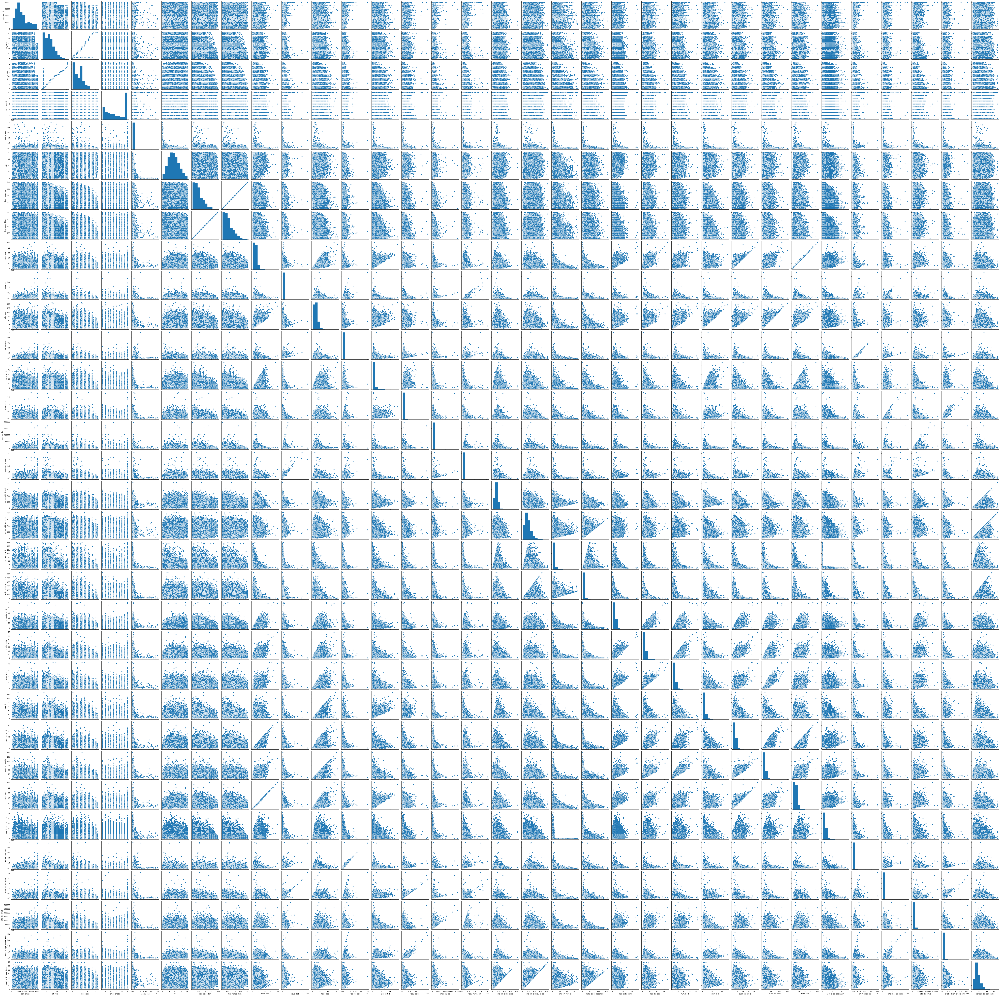

In [39]:
df_less = df[['loan_amnt', 'int_rate', 'sub_grade','emp_length','annual_inc','dti','fico_range_low','fico_range_high','open_acc','revol_bal','total_acc','tot_cur_bal','open_act_il','total_bal_il','max_bal_bc','total_rev_hi_lim','mo_sin_old_il_acct','mo_sin_old_rev_tl_op','mo_sin_rcnt_tl','mths_since_recent_bc','num_actv_bc_tl','num_bc_sats','num_bc_tl','num_il_tl','num_op_rev_tl','num_rev_accts','num_sats','num_tl_op_past_12m','tot_hi_cred_lim','total_bal_ex_mort','total_bc_limit','total_il_high_credit_limit','earliest_to_loan_issue']]
sns.pairplot(df_less)

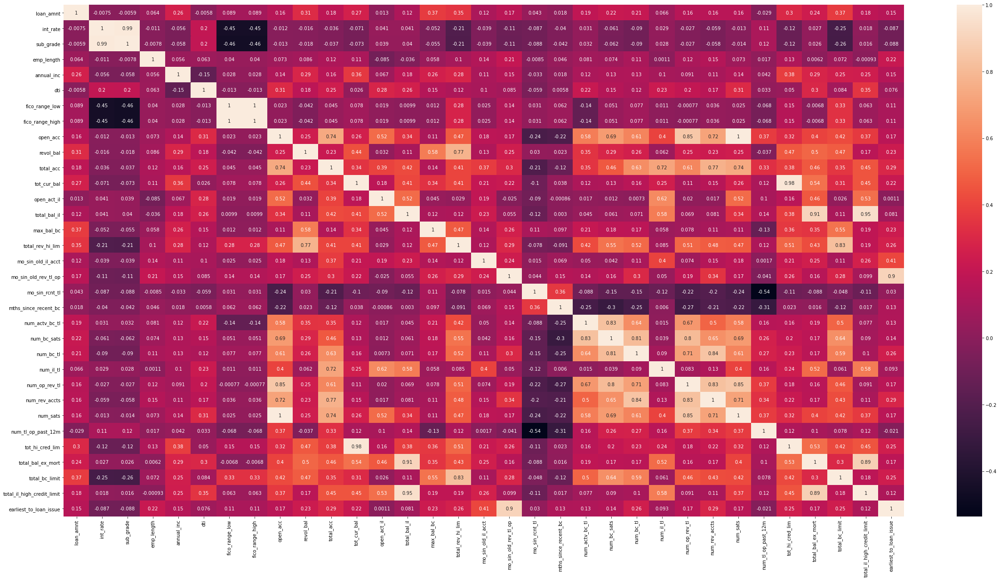

In [41]:
plt.figure(figsize=(40,20))

sns.heatmap(df_less.corr(), annot=True)

### I'll convert these to category codes to test for correlation.

In [42]:
df['home_ownership'] =df['home_ownership'].astype('category').cat.codes
df['verification_status'] =df['verification_status'].astype('category').cat.codes
df['purpose'] =df['purpose'].astype('category').cat.codes

### So int_rate and sub_grade are both determined by the other variables so their correlation is .99.  The next strongest correlation is with the FICO scores (-.46 for both).  The FICO score also is dependent on some of these other variables.  The next largest correlation is term (.32).  

### Should I pick some different variables to investigate?

In [43]:
df.corr()['sub_grade'][:]

loan_amnt                        -0.005903
term                              0.319995
int_rate                          0.988348
installment                       0.027330
sub_grade                         1.000000
emp_length                       -0.007799
home_ownership                    0.081311
annual_inc                       -0.057640
verification_status               0.237677
purpose                           0.105243
dti                               0.195187
delinq_2yrs                       0.108319
fico_range_low                   -0.458945
fico_range_high                  -0.458942
inq_last_6mths                    0.122676
open_acc                         -0.012960
pub_rec                           0.047917
revol_bal                        -0.017795
total_acc                        -0.036794
collections_12_mths_ex_med        0.034007
mths_since_last_major_derog      -0.130448
tot_coll_amt                      0.006240
tot_cur_bal                      -0.072904
open_act_il